In [1]:
! pip install ultralytics

In [2]:
from ultralytics import YOLO
import ultralytics
import cv2
import numpy as np
from sklearn.cluster import KMeans
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms as transforms
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets
from torch.utils.data import Dataset, DataLoader
import seaborn as sns
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from torch.nn import TransformerEncoder, TransformerEncoderLayer
import torch.nn.functional as F
import os
import albumentations as A
from pathlib import Path
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow
import yaml
import numpy as np
import io
import sys
import os
from os.path import join
from matplotlib import pyplot as plt
import ultralytics
import matplotlib.pyplot as plt
from PIL import Image
import torch
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image
import torch

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Single-Shot vs. R-CNN Object Detection \
There are two main approaches to object detection in computer vision: single-shot detectors like YOLO and multi-stage detectors like the R-CNN series (R-CNN, Fast R-CNN, Faster R-CNN).

Processing Stages:

Single-shot detectors (e.g., YOLO) are known for their speed. They process the entire image in one go using a single neural network. This makes them ideal for real-time applications.
Multi-stage detectors (e.g., R-CNN) are slower because they take a step-by-step approach. They often involve proposing regions where objects might be (use a technique called region proposal) and then classifying those regions in separate stages.

Complexity:

Single-shot detectors are simpler models. This translates to faster processing but can sometimes lead to lower accuracy compared to multi-stage models.
Multi-stage detectors are more complex with multiple stages, which allows for more fine-grained processing and potentially higher accuracy. However, this complexity comes at the cost of speed.

YOLO Architecture

The YOLO family utilizes a common architecture with three main components:

Backbone: This is a pre-trained convolutional neural network (CNN) that extracts features from the input image. These features represent different levels of detail, from low-level edges and textures to high-level shapes and objects. Common backbones for YOLO models include Darknet and CSPDarknet.

Neck (Optional): Not explicitly present in all YOLO versions, the neck is responsible for combining features from different layers of the backbone. This allows the model to leverage both high-level semantic information and low-level spatial details for better object detection. Techniques like Feature Pyramid Networks (FPNs) are sometimes used for this purpose.

Head: This final component takes the processed features and predicts bounding boxes and class probabilities for the objects present in the image. It typically consists of multiple convolutional layers and can have different configurations depending on the specific YOLO version.

Different Versions:

YOLOv1 (2015): It divided the image into a grid and predicted bounding boxes and class probabilities for each grid cell. While fast, it isn't the most accurate and struggled with small objects.

YOLOv3 (2018): This version addressed some of YOLOv1's shortcomings. It introduced new techniques like feature extraction from different image scales (multi-scale prediction) and residual connections (inspired by ResNet). This improved accuracy while maintaining good speed.

YOLOv8 (2023): It builds on YOLOv7's success with further improvements in accuracy and efficiency. It introduces a novel C2f module that combines high-level features with contextual information for more precise object detection. Additionally, it maintains the single-shot approach for real-time applications.

The yolov8n model as seen in the cell below has 3011043 parameters in total. It has in total 53 Conv layers.

The yolov8m model on the other hand has 25856899 parameters which is approximately 8.58735627489 time more than the yolov8n model.

In [4]:
results = []

In [5]:
model = YOLO("yolov8n.pt")
model.train(data='/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml', name = 'yolov8n_pre_trained_1', epochs=50, patience=20, batch = 16, device = 0)
result = model.val().results_dict
results.append(result)

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml, epochs=30, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=yolov8n_pre_trained_15, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cr

train: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/train.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8n_pre_trained_15/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8n_pre_trained_15
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.44G      1.198       3.32      1.239         11        640: 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]

                   all         50         52     0.0034      0.981      0.412      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.31G      1.163      2.912      1.195          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         50         52     0.0034      0.981      0.353      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.32G     0.9588      2.208      1.071         11        640: 100%|██████████| 7/7 [00:02<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.76it/s]

                   all         50         52     0.0034      0.981      0.435      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.31G       1.03      2.367      1.156          6        640: 100%|██████████| 7/7 [00:01<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         50         52     0.0034      0.981      0.406      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.32G     0.9519      2.165      1.117          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]

                   all         50         52          1     0.0744      0.535      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.31G     0.9593      1.967       1.12         13        640: 100%|██████████| 7/7 [00:01<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.82it/s]

                   all         50         52          1     0.0926      0.419      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.32G       1.05      2.135      1.171          8        640: 100%|██████████| 7/7 [00:02<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]

                   all         50         52      0.789     0.0726      0.363      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.32G      1.054      2.202      1.149          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.41it/s]

                   all         50         52      0.633      0.212      0.366      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.32G      1.168       2.12      1.239         10        640: 100%|██████████| 7/7 [00:01<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.49it/s]

                   all         50         52      0.585      0.269      0.388      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.31G     0.9932      1.967      1.098         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.04it/s]

                   all         50         52      0.469      0.385      0.345      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.32G       1.16      2.167      1.165          7        640: 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.81it/s]

                   all         50         52      0.228      0.385      0.201     0.0749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.32G      1.145      2.033      1.201         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.52it/s]


                   all         50         52      0.468      0.271      0.288      0.123

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.32G      1.011      1.809      1.123          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.24it/s]

                   all         50         52      0.519      0.353      0.308      0.159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.32G      1.095      1.905      1.184          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.82it/s]

                   all         50         52      0.415      0.519      0.397      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.31G      1.079      2.116      1.131          4        640: 100%|██████████| 7/7 [00:01<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         50         52      0.422      0.577      0.413      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.29G      1.066      1.863      1.147         10        640: 100%|██████████| 7/7 [00:01<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.72it/s]

                   all         50         52      0.546        0.5      0.484      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30       2.3G      1.093      1.929      1.162          7        640: 100%|██████████| 7/7 [00:01<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]

                   all         50         52      0.546      0.439      0.454      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30       2.3G     0.9147      1.602      1.087          7        640: 100%|██████████| 7/7 [00:01<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.05it/s]

                   all         50         52      0.384       0.48      0.373      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.29G     0.9543      1.618      1.076         10        640: 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         50         52       0.32      0.558      0.329      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.29G     0.9158      1.487      1.084          7        640: 100%|██████████| 7/7 [00:01<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.41it/s]

                   all         50         52      0.473      0.517      0.443      0.276


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30       2.3G     0.8716      2.195      1.077          4        640: 100%|██████████| 7/7 [00:04<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]

                   all         50         52      0.547      0.487      0.463      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.29G      1.055      2.117      1.262          4        640: 100%|██████████| 7/7 [00:02<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]

                   all         50         52      0.619      0.481      0.491      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.28G     0.9394      2.225      1.096          5        640: 100%|██████████| 7/7 [00:01<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.57it/s]

                   all         50         52      0.631      0.538      0.535      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.29G     0.9311      2.041      1.151          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.90it/s]


                   all         50         52      0.629      0.652      0.613      0.418

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30       2.3G     0.9045      1.857      1.067          4        640: 100%|██████████| 7/7 [00:02<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         50         52      0.619      0.654      0.619      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.29G     0.8535      1.856      1.084          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.78it/s]

                   all         50         52      0.583      0.692      0.631      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.28G     0.9054      1.759      1.138          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]

                   all         50         52      0.624      0.654      0.612      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.29G     0.8176       1.68      1.017          4        640: 100%|██████████| 7/7 [00:01<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.48it/s]


                   all         50         52       0.68      0.615      0.639      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30       2.3G     0.7477      1.591     0.9604          3        640: 100%|██████████| 7/7 [00:01<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.85it/s]

                   all         50         52      0.651      0.635      0.635      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.29G      0.717      1.564     0.9935          4        640: 100%|██████████| 7/7 [00:02<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.60it/s]

                   all         50         52      0.738      0.596      0.655       0.46



30 epochs completed in 0.033 hours.
Optimizer stripped from runs/detect/yolov8n_pre_trained_15/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8n_pre_trained_15/weights/best.pt, 6.2MB

Validating runs/detect/yolov8n_pre_trained_15/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.92it/s]


                   all         50         52      0.739      0.598      0.654      0.458
Speed: 0.2ms preprocess, 2.6ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_15
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.21s/it]


                   all         50         52      0.749      0.596      0.649      0.447
Speed: 1.2ms preprocess, 43.6ms inference, 0.0ms loss, 7.0ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_152



image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/792bff4e8ae3376e.png: 512x640 1 duck, 60.7ms
Speed: 2.8ms preprocess, 60.7ms inference, 2.3ms postprocess per image at shape (1, 3, 512, 640)


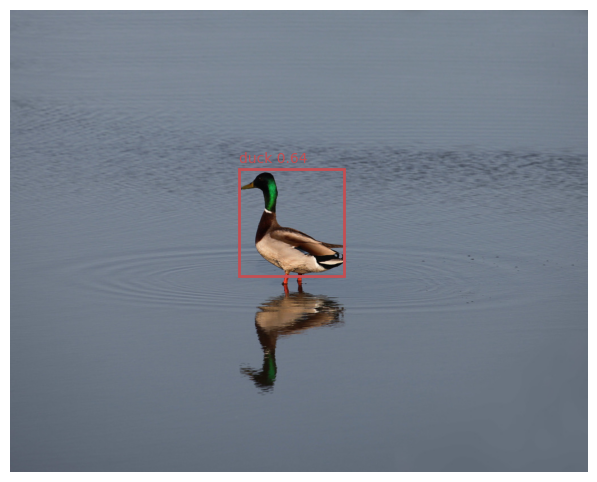


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/9606369a9f3fc6f3.png: 576x640 1 duck, 94.7ms
Speed: 4.2ms preprocess, 94.7ms inference, 1.7ms postprocess per image at shape (1, 3, 576, 640)


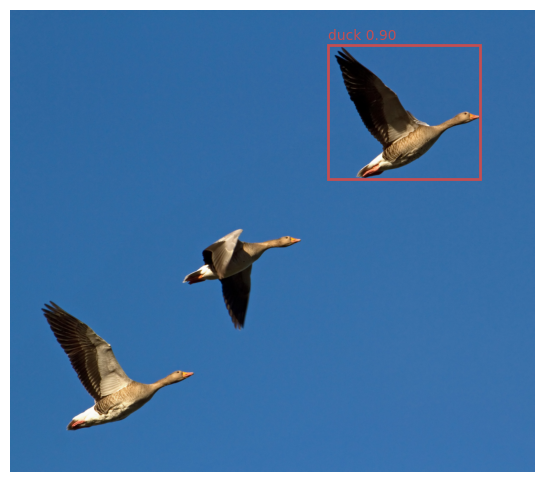


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/abe04919bc29990b.png: 480x640 1 duck, 102.0ms
Speed: 3.9ms preprocess, 102.0ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


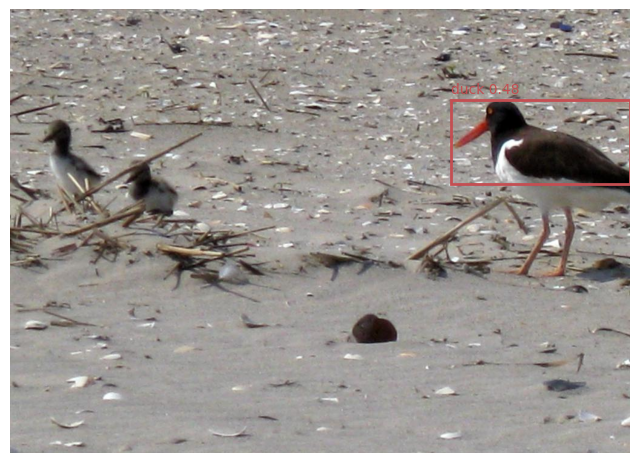


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/b1f40cbe67422d07.png: 416x640 (no detections), 95.4ms
Speed: 3.8ms preprocess, 95.4ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)


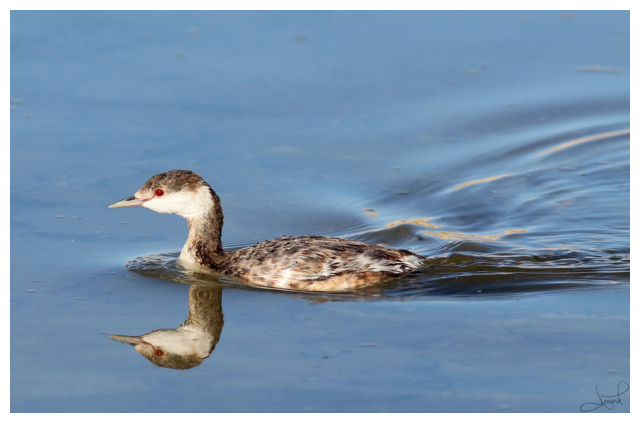

In [6]:
image_paths = [
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/792bff4e8ae3376e.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/9606369a9f3fc6f3.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/abe04919bc29990b.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/b1f40cbe67422d07.png'
]
for image_path in image_paths:
    try:
        output = model(image_path)
        boxes = output[0].boxes.xyxy.tolist()
        classes = output[0].boxes.cls.tolist()
        names = output[0].names
        confidences = output[0].boxes.conf.tolist()

        image = Image.open(image_path)
        plt.figure(figsize=(8, 6))
        plt.imshow(image)

        for box, cls, conf in zip(boxes, classes, confidences):
            x1, y1, x2, y2 = box
            confidence = conf
            detected_class = cls
            name = names[int(cls)]
            rect = Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='r', linewidth=2)
            plt.gca().add_patch(rect)
            plt.text(x1, y1-10, f'{name} {confidence:.2f}', fontsize=10, color='r')

        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")

In [7]:
model = YOLO("yolov8n.pt")
model.train(data='/content/drive/My Drive/CV_Assignment3/archive/config.yaml', name = 'yolov8n_pre_trained_2', epochs=50, patience=20, batch = 16, device = 0)
result = model.val().results_dict
results.append(result)

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/My Drive/CV_Assignment3/archive/config.yaml, epochs=30, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=yolov8n_pre_trained_23, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=F

train: Scanning /content/drive/My Drive/CV_Assignment3/archive/labels/train.cache... 400 images, 0 backgrounds, 0 corrupt: 100%|██████████| 400/400 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/My Drive/CV_Assignment3/archive/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8n_pre_trained_23/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8n_pre_trained_23
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.35G      1.062      2.574      1.185         45        640: 100%|██████████| 25/25 [00:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         50         52      0.331      0.615      0.463       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30       2.3G      1.095       2.19      1.208         30        640: 100%|██████████| 25/25 [00:13<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]

                   all         50         52      0.608      0.288      0.447       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.28G      1.177      2.175      1.267         34        640: 100%|██████████| 25/25 [00:13<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]

                   all         50         52      0.464        0.5      0.474      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.28G      1.227      2.166      1.308         38        640: 100%|██████████| 25/25 [00:13<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         50         52      0.534      0.346      0.392      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.28G      1.269      2.104      1.345         37        640: 100%|██████████| 25/25 [00:12<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]

                   all         50         52      0.474      0.481      0.429      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.28G      1.283      2.038      1.364         33        640: 100%|██████████| 25/25 [00:13<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.04it/s]

                   all         50         52      0.502      0.462      0.438      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.28G      1.277      2.014      1.348         30        640: 100%|██████████| 25/25 [00:13<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         52       0.26      0.359      0.176     0.0775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.28G       1.29       1.95      1.369         39        640: 100%|██████████| 25/25 [00:13<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         50         52      0.559      0.585      0.562      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.28G      1.204      1.815      1.306         42        640: 100%|██████████| 25/25 [00:13<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]

                   all         50         52      0.713      0.538      0.634      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.28G      1.164      1.728      1.294         37        640: 100%|██████████| 25/25 [00:13<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]

                   all         50         52      0.599      0.604      0.572      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.28G      1.164      1.675      1.309         41        640: 100%|██████████| 25/25 [00:13<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         50         52      0.514      0.692      0.585      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.28G      1.149      1.616       1.29         37        640: 100%|██████████| 25/25 [00:13<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         50         52      0.421      0.635      0.475      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.28G      1.104      1.578      1.247         38        640: 100%|██████████| 25/25 [00:13<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         50         52      0.541      0.681      0.607      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.28G      1.088       1.52       1.23         44        640: 100%|██████████| 25/25 [00:13<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         50         52      0.752      0.654      0.745      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.28G      1.061      1.472      1.245         35        640: 100%|██████████| 25/25 [00:13<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]

                   all         50         52      0.737      0.692      0.723      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.28G      1.011      1.417      1.164         31        640: 100%|██████████| 25/25 [00:13<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         50         52      0.697      0.712      0.693      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.28G      1.042      1.388      1.204         31        640: 100%|██████████| 25/25 [00:13<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.56it/s]

                   all         50         52      0.771      0.646       0.74      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.28G     0.9803      1.339      1.162         42        640: 100%|██████████| 25/25 [00:13<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         52      0.646      0.701      0.662      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.28G     0.9624      1.348      1.143         31        640: 100%|██████████| 25/25 [00:13<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.01it/s]

                   all         50         52      0.678      0.769      0.692      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.25G     0.9447      1.329      1.151         37        640: 100%|██████████| 25/25 [00:12<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.78it/s]

                   all         50         52        0.7      0.718      0.729      0.521


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.25G     0.9417      1.432      1.183         16        640: 100%|██████████| 25/25 [00:15<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         50         52      0.738      0.654      0.695      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.25G     0.8905      1.282      1.146         16        640: 100%|██████████| 25/25 [00:12<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]

                   all         50         52      0.685      0.769      0.708      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.25G     0.9129      1.295       1.16         15        640: 100%|██████████| 25/25 [00:12<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.86it/s]

                   all         50         52      0.721      0.673      0.704      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.25G     0.9026      1.228      1.152         17        640: 100%|██████████| 25/25 [00:12<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]

                   all         50         52       0.71       0.75      0.756      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.25G     0.8237      1.135      1.092         15        640: 100%|██████████| 25/25 [00:12<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.82it/s]

                   all         50         52      0.685      0.692      0.731      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.25G     0.7833      1.096      1.081         17        640: 100%|██████████| 25/25 [00:11<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         50         52      0.797      0.692      0.727      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.25G     0.7753      1.087      1.057         16        640: 100%|██████████| 25/25 [00:11<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         50         52      0.706       0.74      0.746       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.25G     0.7537      1.069      1.051         16        640: 100%|██████████| 25/25 [00:12<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         50         52      0.672      0.747      0.741      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.25G     0.7161      1.021      1.018         16        640: 100%|██████████| 25/25 [00:11<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.79it/s]

                   all         50         52      0.731      0.769      0.743      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.25G     0.7092     0.9743      1.037         15        640: 100%|██████████| 25/25 [00:12<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.91it/s]

                   all         50         52      0.722       0.75      0.732      0.577



30 epochs completed in 0.139 hours.
Optimizer stripped from runs/detect/yolov8n_pre_trained_23/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8n_pre_trained_23/weights/best.pt, 6.2MB

Validating runs/detect/yolov8n_pre_trained_23/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]


                   all         50         52      0.732      0.769      0.744      0.581
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_23
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/My Drive/CV_Assignment3/archive/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.03s/it]


                   all         50         52      0.726      0.769      0.747      0.582
Speed: 0.4ms preprocess, 14.2ms inference, 0.0ms loss, 6.4ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_232



image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/792bff4e8ae3376e.png: 512x640 1 duck, 13.4ms
Speed: 3.3ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 640)


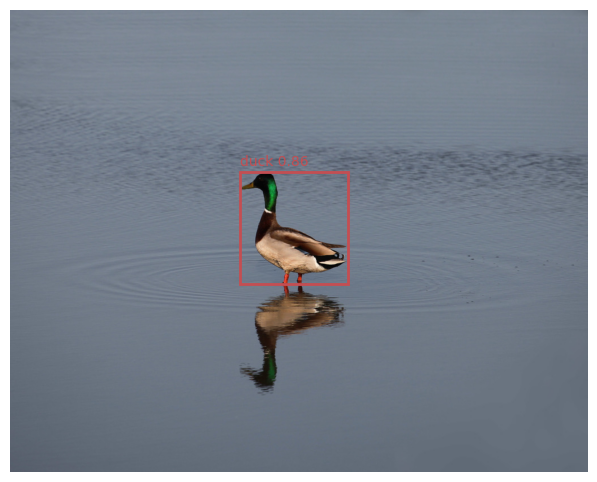


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/9606369a9f3fc6f3.png: 576x640 2 ducks, 20.9ms
Speed: 4.1ms preprocess, 20.9ms inference, 2.1ms postprocess per image at shape (1, 3, 576, 640)


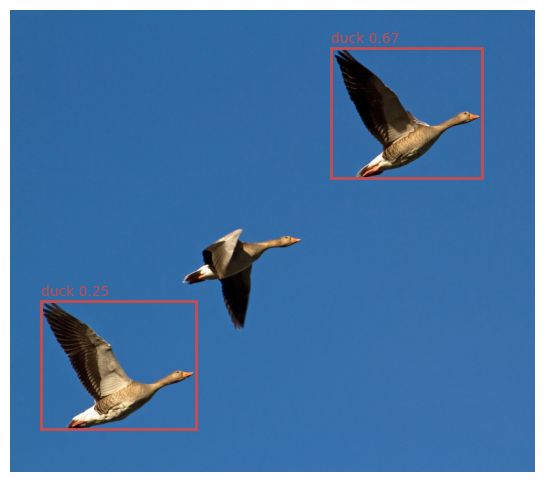


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/abe04919bc29990b.png: 480x640 2 ducks, 15.6ms
Speed: 3.5ms preprocess, 15.6ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


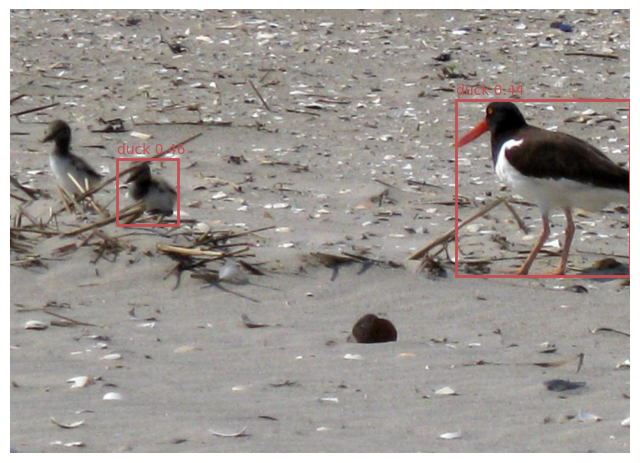


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/b1f40cbe67422d07.png: 416x640 1 duck, 17.4ms
Speed: 3.1ms preprocess, 17.4ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)


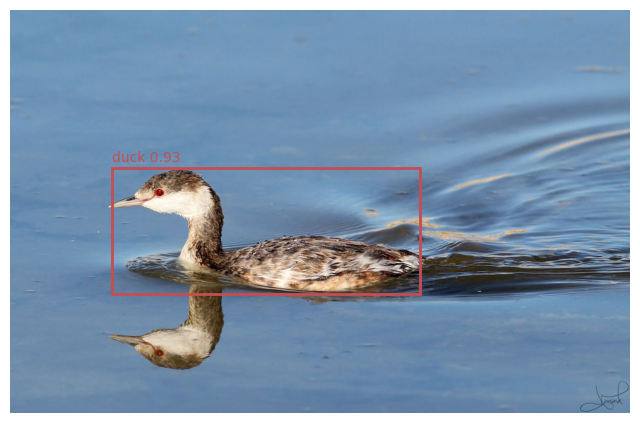

In [8]:
image_paths = [
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/792bff4e8ae3376e.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/9606369a9f3fc6f3.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/abe04919bc29990b.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/b1f40cbe67422d07.png'
]
for image_path in image_paths:
    try:
        output = model(image_path)
        boxes = output[0].boxes.xyxy.tolist()
        classes = output[0].boxes.cls.tolist()
        names = output[0].names
        confidences = output[0].boxes.conf.tolist()

        image = Image.open(image_path)
        plt.figure(figsize=(8, 6))
        plt.imshow(image)

        for box, cls, conf in zip(boxes, classes, confidences):
            x1, y1, x2, y2 = box
            confidence = conf
            detected_class = cls
            name = names[int(cls)]
            rect = Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='r', linewidth=2)
            plt.gca().add_patch(rect)
            plt.text(x1, y1-10, f'{name} {confidence:.2f}', fontsize=10, color='r')

        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")

In [9]:
model = YOLO("yolov8m.pt")
model.train(data='/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml', name = 'yolov8m_pre_trained_1', epochs=50, patience=20, batch = 16, device = 0)
result = model.val().results_dict
results.append(result)

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml, epochs=30, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=yolov8m_pre_trained_13, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cr

train: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/train.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8m_pre_trained_13/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8m_pre_trained_13
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      7.42G      1.007      3.215      1.211         11        640: 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         50         52      0.581      0.865      0.646      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      7.59G     0.9657      3.032      1.192          9        640: 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         50         52      0.373      0.423      0.335      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30       7.6G       1.02       2.07       1.17         11        640: 100%|██████████| 7/7 [00:03<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.63it/s]

                   all         50         52      0.263      0.308      0.187     0.0909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      7.59G      1.138      2.283        1.3          6        640: 100%|██████████| 7/7 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all         50         52      0.302      0.173       0.12     0.0258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      7.63G      1.101      2.104      1.287          9        640: 100%|██████████| 7/7 [00:03<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         50         52      0.455     0.0962     0.0945     0.0272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30       7.6G        1.1      1.782      1.295         13        640: 100%|██████████| 7/7 [00:03<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         50         52      0.179      0.423      0.178     0.0591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      7.64G       1.29      2.008      1.424          8        640: 100%|██████████| 7/7 [00:03<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         50         52    0.00114      0.269   0.000798   0.000233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      7.59G      1.265       2.02      1.353          4        640: 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.74it/s]

                   all         50         52   0.000813      0.192   0.000433   9.94e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      7.63G      1.342      2.205      1.384         10        640: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all         50         52   0.000813      0.192   0.000433   9.94e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      7.59G      1.421      2.142      1.481         10        640: 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]

                   all         50         52   6.78e-05     0.0192   3.46e-05   2.72e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      7.63G      1.393      2.183      1.356          7        640: 100%|██████████| 7/7 [00:03<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.43it/s]

                   all         50         52   0.000136     0.0385   6.93e-05   1.03e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      7.64G      1.443      2.039      1.532         11        640: 100%|██████████| 7/7 [00:03<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]

                   all         50         52   0.000549      0.154   0.000324   7.79e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30       7.6G      1.347      1.896      1.428          8        640: 100%|██████████| 7/7 [00:03<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         50         52   0.000445     0.0962   0.000202   7.05e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      7.63G       1.54       1.94      1.628          9        640: 100%|██████████| 7/7 [00:03<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         50         52   0.000263     0.0577   0.000139   2.75e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      7.29G      1.526      2.168      1.538          4        640: 100%|██████████| 7/7 [00:03<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         50         52    0.00228     0.0962   0.000472   9.61e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30       7.3G        1.5      2.017      1.564         10        640: 100%|██████████| 7/7 [00:03<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52     0.0209      0.308     0.0186    0.00568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      7.26G       1.45      1.917      1.517          7        640: 100%|██████████| 7/7 [00:03<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.76it/s]

                   all         50         52     0.0408      0.173     0.0249      0.008



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      7.28G      1.252      1.709      1.409          7        640: 100%|██████████| 7/7 [00:03<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]

                   all         50         52       0.15      0.231      0.125     0.0528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      7.29G      1.173       1.83      1.309         10        640: 100%|██████████| 7/7 [00:03<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         50         52      0.142      0.231      0.126     0.0403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      7.29G      1.141      1.533      1.305          7        640: 100%|██████████| 7/7 [00:03<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]

                   all         50         52      0.161      0.288       0.13     0.0507


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      7.26G       1.21      1.763      1.398          4        640: 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.91it/s]

                   all         50         52      0.264      0.288       0.19      0.084
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 1, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



21 epochs completed in 0.046 hours.
Optimizer stripped from runs/detect/yolov8m_pre_trained_13/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/yolov8m_pre_trained_13/weights/best.pt, 52.0MB

Validating runs/detect/yolov8m_pre_trained_13/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.98it/s]


                   all         50         52      0.572      0.865      0.637      0.507
Speed: 0.2ms preprocess, 10.3ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/yolov8m_pre_trained_13
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.17s/it]


                   all         50         52      0.564      0.904      0.629        0.5
Speed: 0.4ms preprocess, 50.8ms inference, 0.0ms loss, 10.5ms postprocess per image
Results saved to runs/detect/yolov8m_pre_trained_132



image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/792bff4e8ae3376e.png: 512x640 1 duck, 114.5ms
Speed: 3.7ms preprocess, 114.5ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)


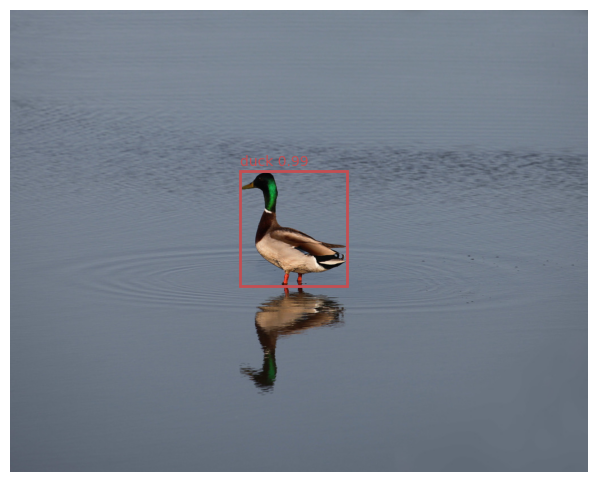


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/9606369a9f3fc6f3.png: 576x640 4 ducks, 122.9ms
Speed: 5.4ms preprocess, 122.9ms inference, 2.5ms postprocess per image at shape (1, 3, 576, 640)


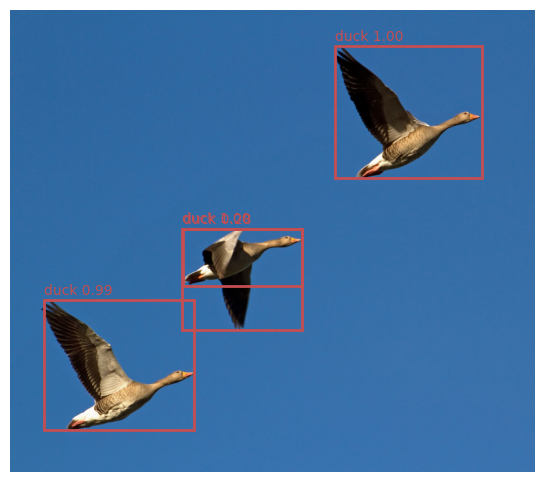


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/abe04919bc29990b.png: 480x640 3 ducks, 121.9ms
Speed: 3.4ms preprocess, 121.9ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)


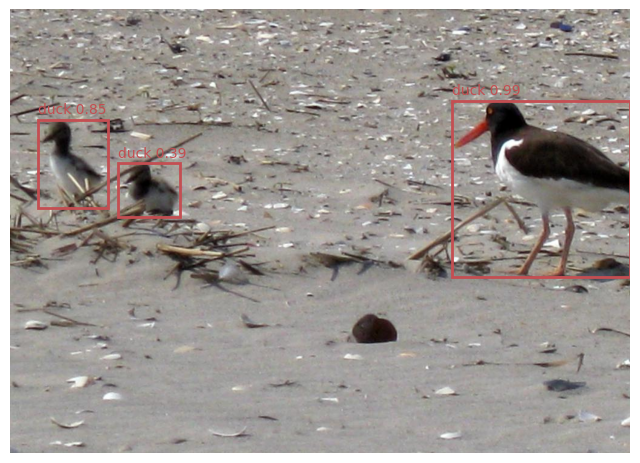


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/b1f40cbe67422d07.png: 416x640 1 duck, 106.2ms
Speed: 5.2ms preprocess, 106.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


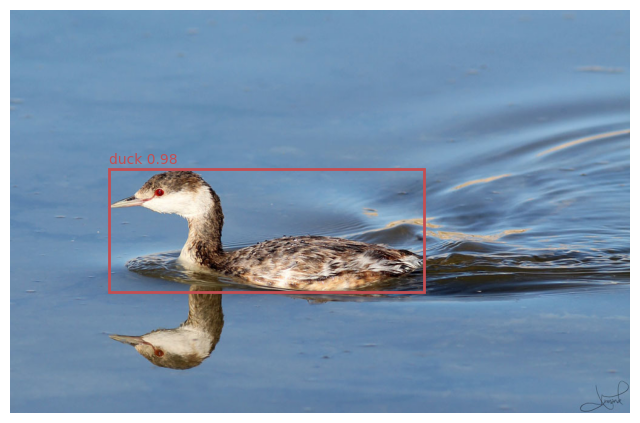

In [10]:
image_paths = [
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/792bff4e8ae3376e.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/9606369a9f3fc6f3.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/abe04919bc29990b.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/b1f40cbe67422d07.png'
]
for image_path in image_paths:
    try:
        output = model(image_path)
        boxes = output[0].boxes.xyxy.tolist()
        classes = output[0].boxes.cls.tolist()
        names = output[0].names
        confidences = output[0].boxes.conf.tolist()

        image = Image.open(image_path)
        plt.figure(figsize=(8, 6))
        plt.imshow(image)

        for box, cls, conf in zip(boxes, classes, confidences):
            x1, y1, x2, y2 = box
            confidence = conf
            detected_class = cls
            name = names[int(cls)]
            rect = Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='r', linewidth=2)
            plt.gca().add_patch(rect)
            plt.text(x1, y1-10, f'{name} {confidence:.2f}', fontsize=10, color='r')

        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")

In [11]:
model = YOLO("yolov8m.pt")
model.train(data='/content/drive/My Drive/CV_Assignment3/archive/config.yaml', name = 'yolov8m_pre_trained_2', epochs=50, patience=20, batch = 16, device = 0)
result = model.val().results_dict
results.append(result)

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/My Drive/CV_Assignment3/archive/config.yaml, epochs=30, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=yolov8m_pre_trained_23, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=F

train: Scanning /content/drive/My Drive/CV_Assignment3/archive/labels/train.cache... 400 images, 0 backgrounds, 0 corrupt: 100%|██████████| 400/400 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/My Drive/CV_Assignment3/archive/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8m_pre_trained_23/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8m_pre_trained_23
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      7.73G      1.041      2.625      1.246         45        640: 100%|██████████| 25/25 [00:49<00:00,  1.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]

                   all         50         52      0.428       0.25      0.216      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      7.26G      1.323      2.142      1.457         30        640: 100%|██████████| 25/25 [00:16<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.96it/s]

                   all         50         52    0.00267      0.519    0.00235   0.000679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      7.28G      1.503      2.253      1.619         34        640: 100%|██████████| 25/25 [00:16<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all         50         52    0.00339      0.615    0.00582    0.00151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      7.26G      1.645      2.282      1.689         38        640: 100%|██████████| 25/25 [00:15<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.02it/s]

                   all         50         52   0.000736      0.212   0.000491   0.000116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      7.26G      1.669      2.216       1.71         37        640: 100%|██████████| 25/25 [00:15<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.49it/s]

                   all         50         52    0.00618      0.442    0.00588    0.00161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      7.26G      1.571      2.112      1.643         33        640: 100%|██████████| 25/25 [00:15<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.04it/s]

                   all         50         52    0.00687      0.481    0.00525    0.00173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30       7.3G      1.537      2.123      1.616         30        640: 100%|██████████| 25/25 [00:15<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]

                   all         50         52     0.0222      0.173     0.0105    0.00354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      7.27G      1.484       2.07      1.566         39        640: 100%|██████████| 25/25 [00:16<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.41it/s]

                   all         50         52      0.131      0.269       0.11     0.0259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      7.26G      1.405      1.904      1.513         42        640: 100%|██████████| 25/25 [00:15<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all         50         52      0.373      0.481       0.33      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      7.26G      1.403      1.885       1.52         37        640: 100%|██████████| 25/25 [00:15<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.40it/s]

                   all         50         52      0.417      0.442      0.446      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      7.26G      1.337      1.781      1.476         41        640: 100%|██████████| 25/25 [00:15<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.79it/s]

                   all         50         52      0.454      0.423      0.431      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30       7.3G      1.329      1.819      1.481         37        640: 100%|██████████| 25/25 [00:15<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.91it/s]

                   all         50         52      0.375      0.635      0.471      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      7.25G      1.246      1.759      1.434         38        640: 100%|██████████| 25/25 [00:16<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.99it/s]

                   all         50         52      0.455      0.558      0.448      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      7.29G      1.232      1.689      1.409         44        640: 100%|██████████| 25/25 [00:15<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]

                   all         50         52      0.769      0.442      0.591      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      7.29G      1.152       1.58      1.374         35        640: 100%|██████████| 25/25 [00:15<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all         50         52      0.525      0.573      0.552      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      7.29G      1.151      1.579      1.332         31        640: 100%|██████████| 25/25 [00:15<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.691        0.5       0.59      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      7.26G      1.111      1.512      1.316         31        640: 100%|██████████| 25/25 [00:15<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]

                   all         50         52      0.505      0.569      0.535      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      7.28G      1.081      1.514      1.299         42        640: 100%|██████████| 25/25 [00:15<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.03it/s]

                   all         50         52      0.527      0.635      0.552      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      7.28G       1.08      1.471      1.276         31        640: 100%|██████████| 25/25 [00:15<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.92it/s]

                   all         50         52      0.792      0.588      0.664      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      7.29G      1.039      1.433      1.259         37        640: 100%|██████████| 25/25 [00:15<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]

                   all         50         52      0.605      0.673      0.652      0.459


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      7.25G      1.049      1.534      1.335         16        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.792      0.658      0.697      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      7.29G          1       1.43      1.303         16        640: 100%|██████████| 25/25 [00:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.44it/s]

                   all         50         52      0.766      0.673      0.711      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30       7.3G      0.992      1.415      1.293         15        640: 100%|██████████| 25/25 [00:14<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.92it/s]

                   all         50         52       0.62      0.627      0.626      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30       7.3G     0.9731       1.37      1.272         17        640: 100%|██████████| 25/25 [00:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         50         52      0.759      0.692      0.714      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      7.25G     0.9124      1.279      1.228         15        640: 100%|██████████| 25/25 [00:14<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.37it/s]

                   all         50         52      0.695      0.692      0.706      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      7.26G     0.8968      1.249      1.212         17        640: 100%|██████████| 25/25 [00:14<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         50         52      0.632      0.693      0.654       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      7.28G     0.9087      1.249      1.205         16        640: 100%|██████████| 25/25 [00:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]

                   all         50         52      0.717      0.683      0.738      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      7.28G     0.8459      1.168      1.192         16        640: 100%|██████████| 25/25 [00:15<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.34it/s]

                   all         50         52      0.657       0.75      0.729       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      7.25G      0.821      1.142       1.14         16        640: 100%|██████████| 25/25 [00:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.96it/s]

                   all         50         52      0.759      0.604      0.701       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      7.28G     0.7953      1.099      1.165         15        640: 100%|██████████| 25/25 [00:15<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         50         52      0.729      0.621      0.687      0.539



30 epochs completed in 0.171 hours.
Optimizer stripped from runs/detect/yolov8m_pre_trained_23/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/yolov8m_pre_trained_23/weights/best.pt, 52.0MB

Validating runs/detect/yolov8m_pre_trained_23/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.90it/s]


                   all         50         52      0.657       0.75      0.729       0.55
Speed: 0.2ms preprocess, 9.9ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/yolov8m_pre_trained_23
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/drive/My Drive/CV_Assignment3/archive/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.18it/s]


                   all         50         52      0.661      0.749      0.728      0.551
Speed: 0.3ms preprocess, 27.7ms inference, 0.0ms loss, 3.4ms postprocess per image
Results saved to runs/detect/yolov8m_pre_trained_232



image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/792bff4e8ae3376e.png: 512x640 1 duck, 29.4ms
Speed: 3.0ms preprocess, 29.4ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 640)


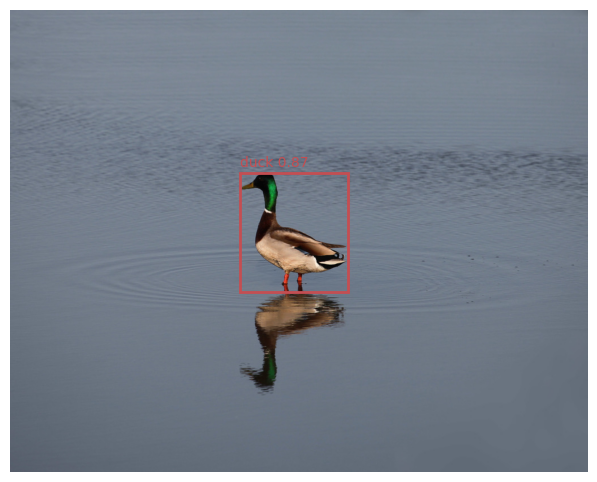


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/9606369a9f3fc6f3.png: 576x640 2 ducks, 39.0ms
Speed: 4.1ms preprocess, 39.0ms inference, 1.4ms postprocess per image at shape (1, 3, 576, 640)


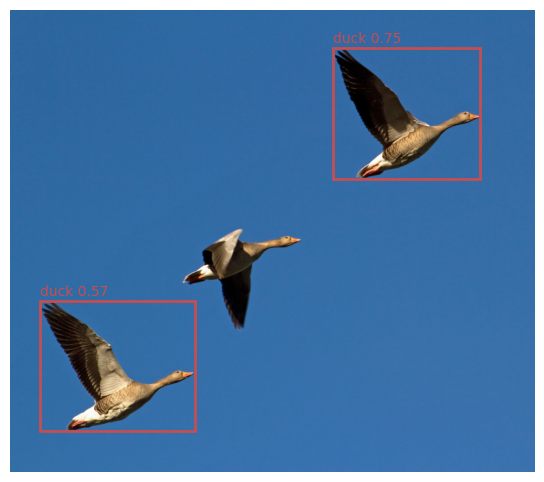


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/abe04919bc29990b.png: 480x640 3 ducks, 30.1ms
Speed: 4.5ms preprocess, 30.1ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)


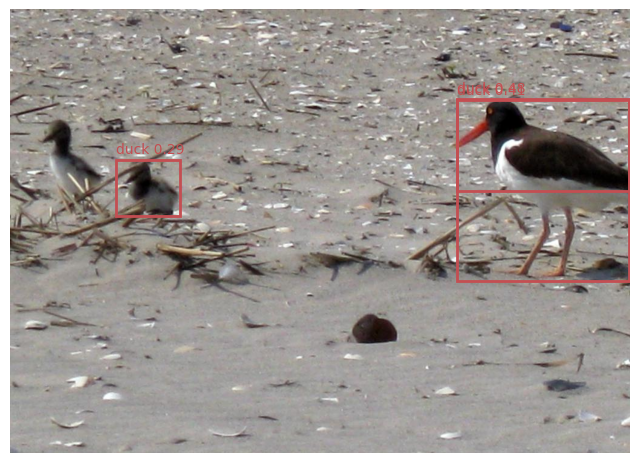


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/b1f40cbe67422d07.png: 416x640 1 duck, 28.9ms
Speed: 3.9ms preprocess, 28.9ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)


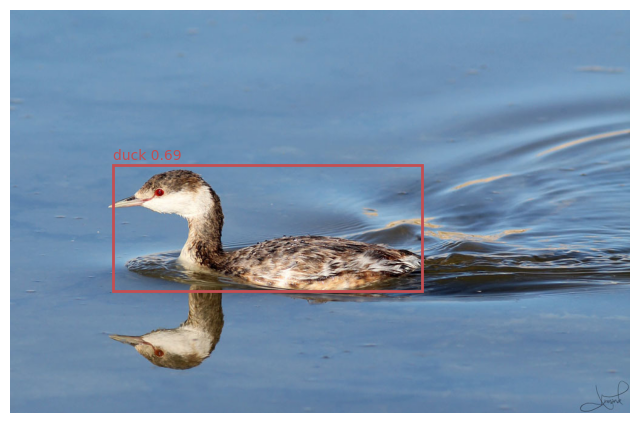

In [12]:
image_paths = [
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/792bff4e8ae3376e.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/9606369a9f3fc6f3.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/abe04919bc29990b.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/b1f40cbe67422d07.png'
]
for image_path in image_paths:
    try:
        output = model(image_path)
        boxes = output[0].boxes.xyxy.tolist()
        classes = output[0].boxes.cls.tolist()
        names = output[0].names
        confidences = output[0].boxes.conf.tolist()

        image = Image.open(image_path)
        plt.figure(figsize=(8, 6))
        plt.imshow(image)

        for box, cls, conf in zip(boxes, classes, confidences):
            x1, y1, x2, y2 = box
            confidence = conf
            detected_class = cls
            name = names[int(cls)]
            rect = Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='r', linewidth=2)
            plt.gca().add_patch(rect)
            plt.text(x1, y1-10, f'{name} {confidence:.2f}', fontsize=10, color='r')

        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")

In [25]:
model = YOLO("yolov8n.yaml")
model.train(data='/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml', name = 'yolov8n_scratch_1', epochs=50, patience=20, batch = 16, pretrained = False, device = 0)
result = model.val().results_dict
results.append(result)

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml, epochs=100, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=yolov8n_scratch_14, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cr

train: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/train.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8n_scratch_14/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8n_scratch_14
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.29G       3.58      4.697      4.426         11        640: 100%|██████████| 7/7 [00:03<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         50         52    0.00224      0.635    0.00443    0.00149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.32G      3.624      4.696      4.301          9        640: 100%|██████████| 7/7 [00:01<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         50         52    0.00225      0.635    0.00592    0.00189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.33G      3.397      4.322      4.235         11        640: 100%|██████████| 7/7 [00:02<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.77it/s]

                   all         50         52    0.00232      0.654    0.00613    0.00185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.32G      3.562      4.422      4.204          6        640: 100%|██████████| 7/7 [00:01<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.72it/s]

                   all         50         52    0.00223      0.635    0.00528    0.00161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.33G      3.379      4.227       4.17          9        640: 100%|██████████| 7/7 [00:01<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.23it/s]

                   all         50         52     0.0022      0.615    0.00499    0.00166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.32G      3.358      4.019      4.101         13        640: 100%|██████████| 7/7 [00:01<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         50         52     0.0022      0.615    0.00606     0.0021



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.29G      3.327      4.286      4.016          8        640: 100%|██████████| 7/7 [00:02<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.45it/s]

                   all         50         52    0.00211      0.596    0.00512    0.00159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100       2.3G      3.272      4.366      3.947          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         50         52    0.00215      0.596     0.0082    0.00303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100       2.3G      3.308      4.118      3.883         10        640: 100%|██████████| 7/7 [00:01<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.84it/s]

                   all         50         52    0.00228      0.615    0.00559    0.00192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.29G      3.241      3.926      3.823         10        640: 100%|██████████| 7/7 [00:01<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         50         52    0.00222      0.596     0.0069    0.00227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100       2.3G      3.263      4.344      3.714          7        640: 100%|██████████| 7/7 [00:02<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]

                   all         50         52    0.00223      0.596    0.00722    0.00236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100       2.3G       3.18      3.899       3.64         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.62it/s]

                   all         50         52    0.00566      0.404    0.00989    0.00354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       2.3G      3.013      3.978      3.633          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.06it/s]

                   all         50         52    0.00627      0.442     0.0252    0.00749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100       2.3G      3.087      4.024      3.604          9        640: 100%|██████████| 7/7 [00:01<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]

                   all         50         52    0.00574        0.5      0.042     0.0138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.29G      3.189      4.219      3.603          4        640: 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.82it/s]

                   all         50         52    0.00539        0.5     0.0208    0.00535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100       2.3G       3.12      3.989      3.516         10        640: 100%|██████████| 7/7 [00:01<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.27it/s]

                   all         50         52    0.00334      0.596     0.0278    0.00512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100       2.3G      3.073      3.838      3.341          7        640: 100%|██████████| 7/7 [00:01<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]

                   all         50         52    0.00325      0.596     0.0199    0.00504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       2.3G       2.78      3.669      3.403          7        640: 100%|██████████| 7/7 [00:01<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         50         52    0.00291      0.577    0.00998    0.00277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.29G      2.961       3.73      3.375         10        640: 100%|██████████| 7/7 [00:02<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.12it/s]

                   all         50         52    0.00338      0.692      0.015    0.00365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       2.3G        2.9      3.684       3.28          7        640: 100%|██████████| 7/7 [00:01<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.69it/s]

                   all         50         52    0.00326       0.75     0.0126     0.0035



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       2.3G      2.951      3.643      3.338          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.38it/s]

                   all         50         52     0.0164      0.192       0.01    0.00291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100       2.3G      2.901      3.697      3.285          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.96it/s]

                   all         50         52      0.825     0.0192      0.032    0.00751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.29G       2.72      3.772       3.27          4        640: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.38it/s]

                   all         50         52      0.839     0.0192     0.0337    0.00797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100       2.3G      2.904      3.614      3.221         11        640: 100%|██████████| 7/7 [00:01<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.45it/s]

                   all         50         52    0.00335      0.827    0.00908    0.00294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100       2.3G      2.936      3.689      3.148          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         50         52    0.00922     0.0192    0.00989    0.00311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100       2.3G      2.763      3.567      3.113          9        640: 100%|██████████| 7/7 [00:01<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.62it/s]

                   all         50         52     0.0595     0.0192     0.0259      0.007



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.29G      2.837      3.521      3.141          9        640: 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         50         52    0.00333      0.846     0.0211    0.00496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       2.3G      2.944      3.634      3.226          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.25it/s]

                   all         50         52    0.00393       0.75     0.0359    0.00835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100       2.3G      2.869      3.443      3.185         14        640: 100%|██████████| 7/7 [00:01<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         50         52    0.00314      0.788     0.0445     0.0106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100       2.3G      2.722      3.468      3.099          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.80it/s]

                   all         50         52     0.0443     0.0769     0.0282    0.00765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.29G      2.711      3.412      3.078          6        640: 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.69it/s]


                   all         50         52     0.0346     0.0577     0.0102     0.0031

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100       2.3G      2.765      3.476       3.04         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.77it/s]

                   all         50         52      0.083     0.0385     0.0162    0.00476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100       2.3G      2.795      3.413      3.012          7        640: 100%|██████████| 7/7 [00:01<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.77it/s]

                   all         50         52     0.0649     0.0577      0.018    0.00494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100       2.3G      2.667      3.322      3.026          8        640: 100%|██████████| 7/7 [00:01<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         50         52     0.0619     0.0385     0.0182    0.00648
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 14, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



34 epochs completed in 0.035 hours.
Optimizer stripped from runs/detect/yolov8n_scratch_14/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8n_scratch_14/weights/best.pt, 6.2MB

Validating runs/detect/yolov8n_scratch_14/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]


                   all         50         52    0.00573        0.5     0.0416     0.0137
Speed: 0.3ms preprocess, 3.1ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/yolov8n_scratch_14
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.49it/s]


                   all         50         52    0.00594        0.5      0.042     0.0139
Speed: 0.4ms preprocess, 10.9ms inference, 0.0ms loss, 4.8ms postprocess per image
Results saved to runs/detect/yolov8n_scratch_142



image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/792bff4e8ae3376e.png: 512x640 (no detections), 17.7ms
Speed: 3.5ms preprocess, 17.7ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)


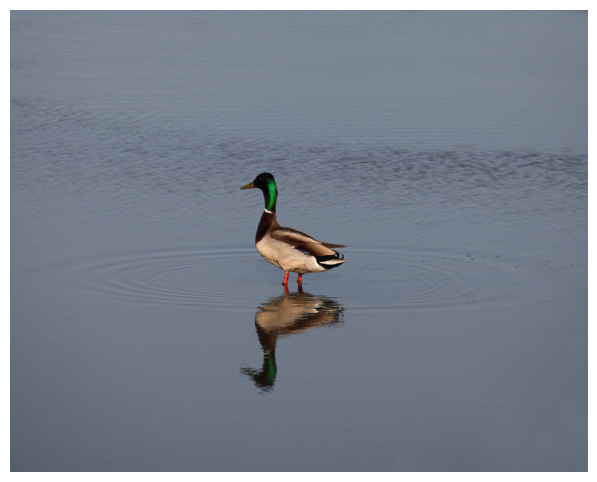


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/9606369a9f3fc6f3.png: 576x640 (no detections), 28.6ms
Speed: 4.1ms preprocess, 28.6ms inference, 0.8ms postprocess per image at shape (1, 3, 576, 640)


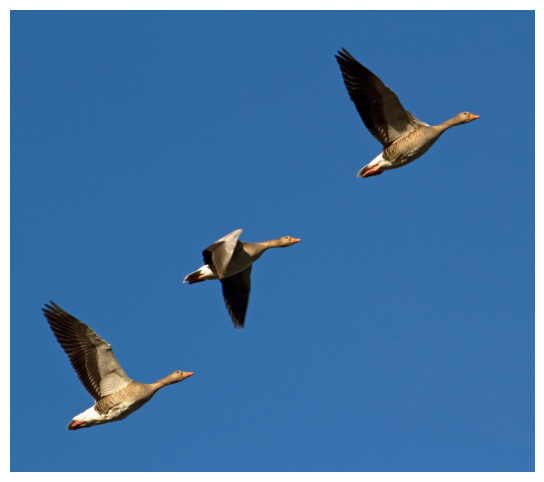


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/abe04919bc29990b.png: 480x640 (no detections), 32.6ms
Speed: 3.4ms preprocess, 32.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


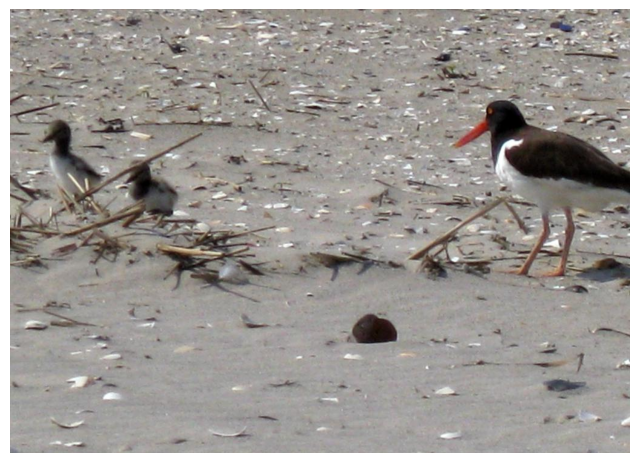


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/b1f40cbe67422d07.png: 416x640 (no detections), 21.9ms
Speed: 3.0ms preprocess, 21.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


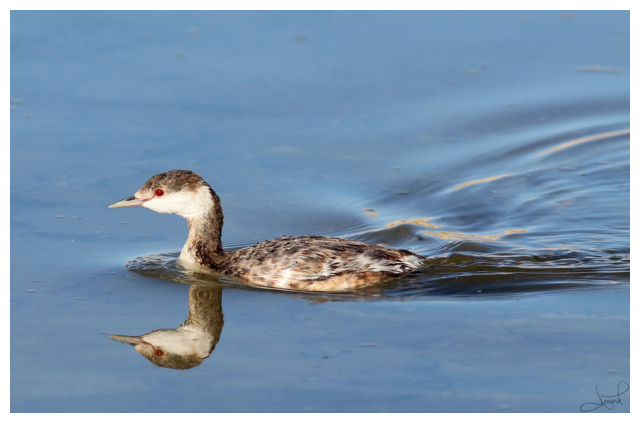

In [26]:
image_paths = [
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/792bff4e8ae3376e.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/9606369a9f3fc6f3.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/abe04919bc29990b.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/b1f40cbe67422d07.png'
]
for image_path in image_paths:
    try:
        output = model(image_path)
        boxes = output[0].boxes.xyxy.tolist()
        classes = output[0].boxes.cls.tolist()
        names = output[0].names
        confidences = output[0].boxes.conf.tolist()

        image = Image.open(image_path)
        plt.figure(figsize=(8, 6))
        plt.imshow(image)

        for box, cls, conf in zip(boxes, classes, confidences):
            x1, y1, x2, y2 = box
            confidence = conf
            detected_class = cls
            name = names[int(cls)]
            rect = Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='r', linewidth=2)
            plt.gca().add_patch(rect)
            plt.text(x1, y1-10, f'{name} {confidence:.2f}', fontsize=10, color='r')

        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")

In [15]:
model = YOLO("yolov8n.yaml")
model.train(data='/content/drive/My Drive/CV_Assignment3/archive/config.yaml', name = 'yolov8n_scratch_2', epochs=50, patience=20, batch = 16, pretrained = False, device = 0)
result = model.val().results_dict
results.append(result)

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/drive/My Drive/CV_Assignment3/archive/config.yaml, epochs=50, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=yolov8n_scratch_23, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fa

train: Scanning /content/drive/My Drive/CV_Assignment3/archive/labels/train.cache... 400 images, 0 backgrounds, 0 corrupt: 100%|██████████| 400/400 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/My Drive/CV_Assignment3/archive/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8n_scratch_23/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8n_scratch_23
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.28G      3.446      4.276      4.287         45        640: 100%|██████████| 25/25 [00:15<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         50         52    0.00231      0.654     0.0047    0.00153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.28G      3.314      4.081      4.084         30        640: 100%|██████████| 25/25 [00:14<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all         50         52    0.00218      0.615    0.00542    0.00161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.29G      3.162      3.926      3.808         34        640: 100%|██████████| 25/25 [00:13<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.78it/s]

                   all         50         52    0.00642      0.519    0.00839    0.00282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.29G      3.041      3.756      3.532         38        640: 100%|██████████| 25/25 [00:13<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.53it/s]

                   all         50         52    0.00147     0.0577    0.00192   0.000243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.29G      2.887      3.577      3.362         37        640: 100%|██████████| 25/25 [00:13<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         52      0.042     0.0192     0.0059    0.00136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.29G      2.874      3.497      3.275         33        640: 100%|██████████| 25/25 [00:13<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         50         52    0.00432      0.654     0.0043    0.00124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.29G      2.782      3.388      3.173         30        640: 100%|██████████| 25/25 [00:13<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         50         52      0.788     0.0385     0.0613     0.0168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.29G      2.771      3.347       3.19         39        640: 100%|██████████| 25/25 [00:14<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all         50         52     0.0652     0.0962     0.0391       0.01



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.29G      2.675       3.28      3.093         42        640: 100%|██████████| 25/25 [00:13<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.55it/s]

                   all         50         52     0.0779      0.173     0.0319    0.00754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.29G      2.647      3.177      3.007         37        640: 100%|██████████| 25/25 [00:13<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         50         52     0.0342      0.288     0.0217    0.00544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.25G      2.592      3.074      2.971         41        640: 100%|██████████| 25/25 [00:13<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.65it/s]

                   all         50         52      0.105      0.115     0.0886     0.0239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.25G       2.56      3.063      2.943         37        640: 100%|██████████| 25/25 [00:13<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         50         52      0.163      0.269     0.0953     0.0254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.25G      2.482      2.975      2.895         38        640: 100%|██████████| 25/25 [00:13<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         50         52      0.255      0.135      0.144     0.0379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.25G      2.424      2.997      2.864         44        640: 100%|██████████| 25/25 [00:13<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         50         52      0.178      0.154      0.141     0.0452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.25G      2.384      2.937      2.852         35        640: 100%|██████████| 25/25 [00:14<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.45it/s]

                   all         50         52      0.244      0.308       0.19     0.0648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.25G      2.333      2.886      2.778         31        640: 100%|██████████| 25/25 [00:13<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]

                   all         50         52     0.0699      0.384     0.0649     0.0187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.25G      2.338       2.82      2.757         31        640: 100%|██████████| 25/25 [00:14<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         50         52      0.276      0.327       0.23     0.0722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.25G      2.342      2.792      2.719         42        640: 100%|██████████| 25/25 [00:13<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         50         52       0.33      0.385      0.315     0.0914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.25G      2.293      2.767      2.645         31        640: 100%|██████████| 25/25 [00:14<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]

                   all         50         52      0.651      0.108      0.182     0.0851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.25G      2.194      2.799      2.644         37        640: 100%|██████████| 25/25 [00:13<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.42it/s]

                   all         50         52      0.414     0.0547     0.0817     0.0267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.25G      2.163      2.672       2.61         31        640: 100%|██████████| 25/25 [00:13<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.94it/s]

                   all         50         52      0.199      0.249      0.152     0.0613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.25G      2.147      2.612      2.603         32        640: 100%|██████████| 25/25 [00:13<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         50         52      0.188      0.346      0.177     0.0708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.25G      2.129      2.641      2.542         29        640: 100%|██████████| 25/25 [00:13<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.77it/s]

                   all         50         52      0.344      0.269      0.272      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.25G      2.158      2.653      2.539         37        640: 100%|██████████| 25/25 [00:13<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.67it/s]

                   all         50         52      0.243      0.269      0.185     0.0714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.25G      2.083      2.625      2.554         39        640: 100%|██████████| 25/25 [00:13<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         52      0.254      0.173      0.139     0.0469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.25G      2.055      2.589      2.514         34        640: 100%|██████████| 25/25 [00:13<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         52       0.26      0.308      0.218     0.0873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.25G       2.06      2.579      2.451         34        640: 100%|██████████| 25/25 [00:13<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]

                   all         50         52      0.233       0.25      0.203     0.0701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.26G      1.988      2.445      2.443         28        640: 100%|██████████| 25/25 [00:14<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]

                   all         50         52        0.4      0.308       0.33       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.25G       2.02      2.546       2.41         27        640: 100%|██████████| 25/25 [00:13<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]

                   all         50         52      0.485      0.442      0.388      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.25G      1.965      2.431      2.408         38        640: 100%|██████████| 25/25 [00:12<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.355      0.385      0.279      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.25G      1.955      2.433       2.39         32        640: 100%|██████████| 25/25 [00:13<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.63it/s]

                   all         50         52      0.433      0.288       0.34      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.25G      1.945      2.345      2.373         36        640: 100%|██████████| 25/25 [00:13<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         52      0.243      0.365      0.266      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.25G      1.897      2.322      2.301         33        640: 100%|██████████| 25/25 [00:13<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.38it/s]

                   all         50         52      0.307      0.308      0.274      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.25G      1.884      2.312      2.315         36        640: 100%|██████████| 25/25 [00:13<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.48it/s]

                   all         50         52      0.445      0.308      0.321      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.25G      1.841       2.29       2.28         34        640: 100%|██████████| 25/25 [00:14<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.86it/s]

                   all         50         52      0.429      0.365      0.351      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.25G      1.899      2.322      2.325         28        640: 100%|██████████| 25/25 [00:13<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         50         52      0.399      0.365      0.305       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.25G      1.839      2.248      2.251         35        640: 100%|██████████| 25/25 [00:13<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.65it/s]

                   all         50         52      0.533      0.404      0.453      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.25G      1.812      2.231      2.247         39        640: 100%|██████████| 25/25 [00:13<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         50         52      0.694      0.423      0.466      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.25G      1.815      2.248      2.234         37        640: 100%|██████████| 25/25 [00:12<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         50         52      0.562      0.404      0.397      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.25G      1.813      2.251      2.228         30        640: 100%|██████████| 25/25 [00:13<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         50         52      0.588      0.439       0.43      0.201


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.25G      1.762      2.325      2.229         16        640: 100%|██████████| 25/25 [00:16<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]

                   all         50         52      0.427      0.385      0.343      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.25G      1.698       2.25      2.216         17        640: 100%|██████████| 25/25 [00:12<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         50         52      0.522      0.441      0.393      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.25G      1.688      2.187      2.157         15        640: 100%|██████████| 25/25 [00:13<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]

                   all         50         52      0.536      0.489       0.44      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.25G      1.642      2.097      2.153         18        640: 100%|██████████| 25/25 [00:12<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         50         52      0.544      0.423      0.438      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.25G      1.622      2.109      2.131         18        640: 100%|██████████| 25/25 [00:12<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         50         52      0.733      0.462      0.488      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.25G       1.65      2.141      2.152         16        640: 100%|██████████| 25/25 [00:12<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]

                   all         50         52      0.726      0.404      0.515      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.25G      1.607       2.07      2.107         15        640: 100%|██████████| 25/25 [00:12<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.63it/s]

                   all         50         52      0.624      0.442      0.498       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.25G      1.617      2.095      2.139         17        640: 100%|██████████| 25/25 [00:12<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]

                   all         50         52      0.623        0.5      0.542      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.25G      1.591      2.027      2.078         15        640: 100%|██████████| 25/25 [00:12<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.65it/s]

                   all         50         52      0.725      0.538      0.562      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.25G      1.605      2.001      2.089         15        640: 100%|██████████| 25/25 [00:11<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         52      0.719      0.519      0.556      0.304



50 epochs completed in 0.221 hours.
Optimizer stripped from runs/detect/yolov8n_scratch_23/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/yolov8n_scratch_23/weights/best.pt, 6.3MB

Validating runs/detect/yolov8n_scratch_23/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.31it/s]


                   all         50         52      0.625        0.5      0.542      0.312
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/yolov8n_scratch_23
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/My Drive/CV_Assignment3/archive/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.38it/s]


                   all         50         52       0.61      0.481      0.544      0.311
Speed: 0.2ms preprocess, 15.3ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to runs/detect/yolov8n_scratch_232



image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/792bff4e8ae3376e.png: 512x640 1 duck, 16.2ms
Speed: 3.5ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 640)


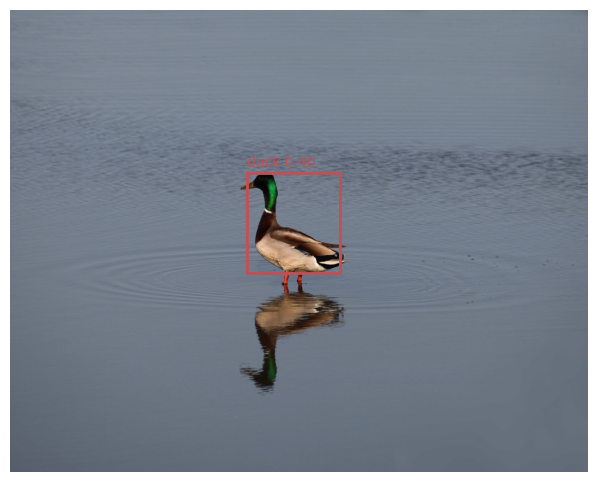


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/9606369a9f3fc6f3.png: 576x640 2 ducks, 22.6ms
Speed: 3.9ms preprocess, 22.6ms inference, 1.8ms postprocess per image at shape (1, 3, 576, 640)


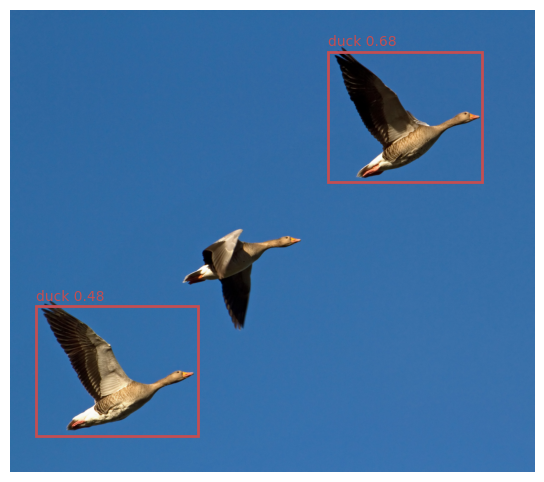


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/abe04919bc29990b.png: 480x640 1 duck, 23.1ms
Speed: 3.4ms preprocess, 23.1ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


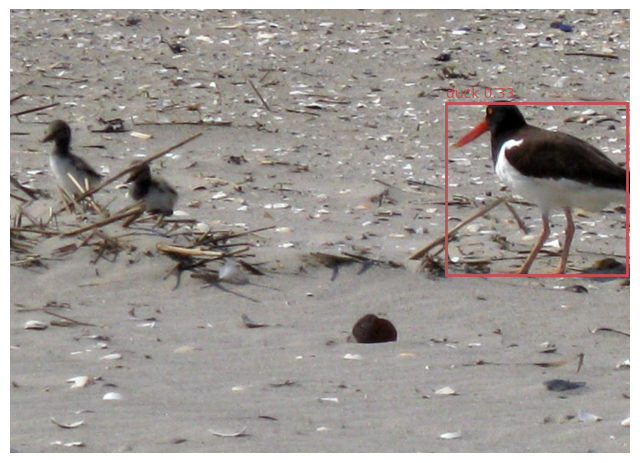


image 1/1 /content/drive/My Drive/CV_Assignment3/archive/images/train/b1f40cbe67422d07.png: 416x640 (no detections), 20.8ms
Speed: 3.0ms preprocess, 20.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


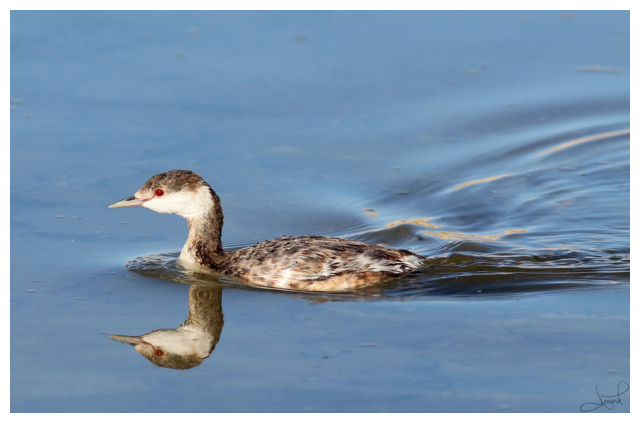

In [16]:
image_paths = [
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/792bff4e8ae3376e.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/9606369a9f3fc6f3.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/abe04919bc29990b.png',
    '/content/drive/My Drive/CV_Assignment3/archive/images/train/b1f40cbe67422d07.png'
]
for image_path in image_paths:
    try:
        output = model(image_path)
        boxes = output[0].boxes.xyxy.tolist()
        classes = output[0].boxes.cls.tolist()
        names = output[0].names
        confidences = output[0].boxes.conf.tolist()

        image = Image.open(image_path)
        plt.figure(figsize=(8, 6))
        plt.imshow(image)

        for box, cls, conf in zip(boxes, classes, confidences):
            x1, y1, x2, y2 = box
            confidence = conf
            detected_class = cls
            name = names[int(cls)]
            rect = Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='r', linewidth=2)
            plt.gca().add_patch(rect)
            plt.text(x1, y1-10, f'{name} {confidence:.2f}', fontsize=10, color='r')

        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")

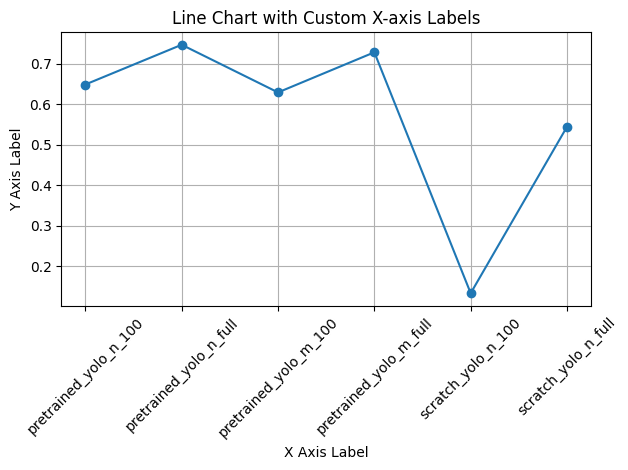

In [17]:
objects = [1, 2, 3, 4, 5, 6]
x_labels = ['pretrained_yolo_n_100', 'pretrained_yolo_n_full', 'pretrained_yolo_m_100', 'pretrained_yolo_m_full', 'scratch_yolo_n_100', 'scratch_yolo_n_full']
y_values = [result['metrics/mAP50(B)'] for result in results]

plt.plot(objects, y_values, marker='o')
plt.xticks(objects, x_labels, rotation=45)
plt.xlabel('X Axis Label')
plt.ylabel('Y Axis Label')
plt.title('Line Chart with Custom X-axis Labels')
plt.grid(True)
plt.tight_layout()
plt.show()

As we can see, The bigger dataset always performs better as compared to the smaller dataset with 100 images only.

Also, we can see from the visualizations that the outputs of the bigger yolov8m model are much better than the yolov8n model. It is able to detect more number of ducks more precisely.

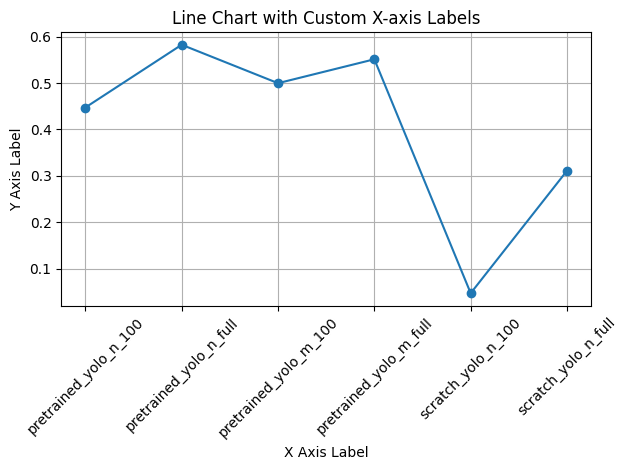

In [18]:
objects = [1, 2, 3, 4, 5, 6]
x_labels = ['pretrained_yolo_n_100', 'pretrained_yolo_n_full', 'pretrained_yolo_m_100', 'pretrained_yolo_m_full', 'scratch_yolo_n_100', 'scratch_yolo_n_full']
y_values = [result['metrics/mAP50-95(B)'] for result in results]

plt.plot(objects, y_values, marker='o')
plt.xticks(objects, x_labels, rotation=45)
plt.xlabel('X Axis Label')
plt.ylabel('Y Axis Label')
plt.title('Line Chart with Custom X-axis Labels')
plt.grid(True)
plt.tight_layout()
plt.show()

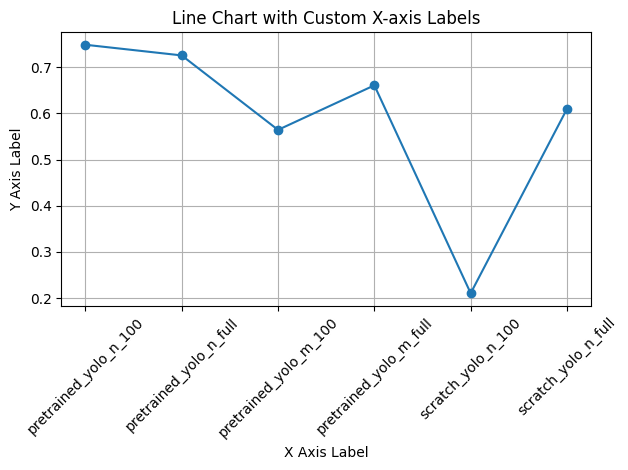

In [19]:
objects = [1, 2, 3, 4, 5, 6]
x_labels = ['pretrained_yolo_n_100', 'pretrained_yolo_n_full', 'pretrained_yolo_m_100', 'pretrained_yolo_m_full', 'scratch_yolo_n_100', 'scratch_yolo_n_full']
y_values = [result['metrics/precision(B)'] for result in results]

plt.plot(objects, y_values, marker='o')
plt.xticks(objects, x_labels, rotation=45)
plt.xlabel('X Axis Label')
plt.ylabel('Y Axis Label')
plt.title('Line Chart with Custom X-axis Labels')
plt.grid(True)
plt.tight_layout()
plt.show()

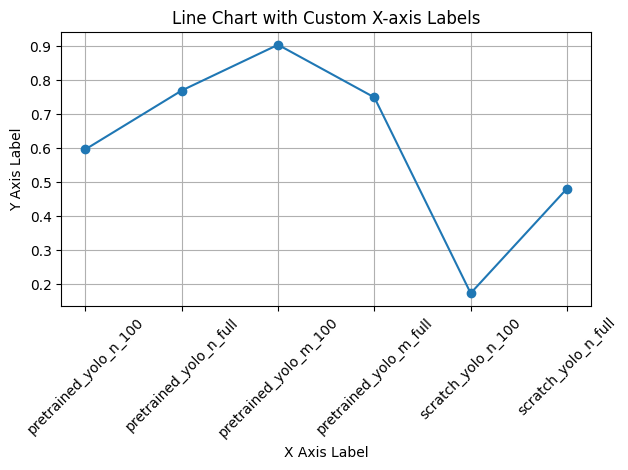

In [20]:
objects = [1, 2, 3, 4, 5, 6]
x_labels = ['pretrained_yolo_n_100', 'pretrained_yolo_n_full', 'pretrained_yolo_m_100', 'pretrained_yolo_m_full', 'scratch_yolo_n_100', 'scratch_yolo_n_full']
y_values = [result['metrics/recall(B)'] for result in results]

plt.plot(objects, y_values, marker='o')
plt.xticks(objects, x_labels, rotation=45)
plt.xlabel('X Axis Label')
plt.ylabel('Y Axis Label')
plt.title('Line Chart with Custom X-axis Labels')
plt.grid(True)
plt.tight_layout()
plt.show()

Following are the augmentationas which where used in the above models:

Blur(p=0.01, blur_limit=(3, 7)) : Applies gaussian blur on the images with a probability of 0.01.

MedianBlur(p=0.01, blur_limit=(3, 7)) : Applies a median blur effect to the image.

ToGray(p=0.01) : Converts the image from color (RGB or BGR) to grayscale.

CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8)) : Applies Contrast Limited Adaptive Histogram Equalization (CLAHE) to the image.

Also, augmentations like hsv_h, hsv_s, hsv_v, translate, scale, fliplr, mosaic, erasing, crop_fraction are applied by Yolo on default.

In [21]:
model = YOLO("yolov8n.pt")
model.train(data='/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml', name = 'yolov8n_pre_trained_1', epochs=50, patience=20, batch = 16, device = 0, close_mosaic = 30)
result = model.val().results_dict

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml, epochs=30, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=yolov8n_pre_trained_16, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=30, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cr

train: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/train.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8n_pre_trained_16/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8n_pre_trained_16
Starting training for 30 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.31G      1.223      3.993        1.3          6        640: 100%|██████████| 7/7 [00:05<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         52    0.00333      0.962      0.483      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.31G      1.085      3.367      1.225          5        640: 100%|██████████| 7/7 [00:01<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         50         52     0.0034      0.981      0.562      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.32G      1.077      3.126      1.169          4        640: 100%|██████████| 7/7 [00:02<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.98it/s]

                   all         50         52    0.00333      0.962      0.463      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.31G      1.036      2.986        1.2          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.22it/s]

                   all         50         52    0.00333      0.962      0.311      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.32G      1.068      3.021      1.209          5        640: 100%|██████████| 7/7 [00:01<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.46it/s]

                   all         50         52      0.804      0.158      0.563      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.31G       1.06       2.86      1.256          5        640: 100%|██████████| 7/7 [00:01<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.43it/s]

                   all         50         52     0.0051      0.865       0.47      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.32G      1.071      2.932      1.292          4        640: 100%|██████████| 7/7 [00:01<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         50         52      0.329      0.538      0.337      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.32G      1.092       2.79       1.21          5        640: 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.85it/s]

                   all         50         52    0.00519      0.885      0.259      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.32G      1.224      2.791      1.243          3        640: 100%|██████████| 7/7 [00:01<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.68it/s]

                   all         50         52      0.505     0.0962      0.272      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.31G      1.197      2.724      1.359          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.83it/s]

                   all         50         52      0.195      0.154      0.169     0.0536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.32G      1.227      2.919      1.345          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]

                   all         50         52      0.242      0.173      0.188     0.0685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.32G      1.179       2.82      1.332          5        640: 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.73it/s]

                   all         50         52      0.309       0.25      0.203     0.0857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.32G      1.234      2.698        1.4          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.86it/s]


                   all         50         52      0.401      0.231      0.198     0.0682

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.32G      1.218      2.643      1.279          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.46it/s]

                   all         50         52       0.34      0.268      0.232     0.0795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.28G      1.328      2.786      1.326          4        640: 100%|██████████| 7/7 [00:02<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.07it/s]

                   all         50         52      0.313      0.173      0.129     0.0396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.29G      1.179      2.459      1.231          4        640: 100%|██████████| 7/7 [00:02<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.04it/s]

                   all         50         52      0.481       0.25      0.196     0.0772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.29G      1.136      2.312      1.227          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.07it/s]

                   all         50         52      0.367      0.404      0.291       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.29G      1.097      2.393       1.24          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.33it/s]


                   all         50         52      0.603      0.385      0.432      0.242

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.28G      1.099      2.305      1.212          4        640: 100%|██████████| 7/7 [00:01<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         50         52      0.453      0.558       0.39        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.29G      1.161      2.294       1.21          4        640: 100%|██████████| 7/7 [00:03<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.57it/s]

                   all         50         52      0.484      0.481      0.337      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.29G       1.02       2.15      1.177          4        640: 100%|██████████| 7/7 [00:02<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.60it/s]

                   all         50         52      0.389      0.481      0.331      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.29G     0.9658      2.127      1.138          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.63it/s]

                   all         50         52       0.66      0.442       0.47      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.28G      0.977       1.97      1.094          5        640: 100%|██████████| 7/7 [00:01<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.76it/s]

                   all         50         52        0.6        0.5      0.523       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.29G     0.8993      1.911      1.106          4        640: 100%|██████████| 7/7 [00:02<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.04it/s]

                   all         50         52      0.659      0.557      0.561      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.29G     0.9396      2.125      1.132          4        640: 100%|██████████| 7/7 [00:01<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.52it/s]

                   all         50         52      0.602      0.596      0.571      0.334
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 5, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



25 epochs completed in 0.027 hours.
Optimizer stripped from runs/detect/yolov8n_pre_trained_16/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8n_pre_trained_16/weights/best.pt, 6.2MB

Validating runs/detect/yolov8n_pre_trained_16/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]


                   all         50         52      0.804      0.158      0.561      0.368
Speed: 0.2ms preprocess, 3.0ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_16
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.37it/s]


                   all         50         52      0.804      0.158      0.567      0.371
Speed: 0.8ms preprocess, 9.6ms inference, 0.0ms loss, 6.8ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_162


In [22]:
results[0]

{'metrics/precision(B)': 0.7485858748220959,
 'metrics/recall(B)': 0.5961538461538461,
 'metrics/mAP50(B)': 0.648826840933611,
 'metrics/mAP50-95(B)': 0.4472052540199539,
 'fitness': 0.46736741271131965}

In [7]:
! pip uninstall -y albumentations

Found existing installation: albumentations 1.4.3
Uninstalling albumentations-1.4.3:
  Successfully uninstalled albumentations-1.4.3


In [6]:
model = YOLO("yolov8n.pt")
model.train(data='/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml', name = 'yolov8n_pre_trained_1', epochs=50, patience=20, batch = 16, close_mosaic = 30)
result = model.val().results_dict

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml, epochs=50, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_pre_trained_1, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=30, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fal

100%|██████████| 755k/755k [00:00<00:00, 22.8MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/train.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]

Plotting labels to runs/detect/yolov8n_pre_trained_1/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/yolov8n_pre_trained_1
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G     0.9325      3.153      1.141          8        640: 100%|██████████| 7/7 [00:59<00:00,  8.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.61s/it]

                   all         50         52     0.0034      0.981      0.571      0.411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/50         0G     0.9212      2.555      1.078          8        640: 100%|██████████| 7/7 [00:59<00:00,  8.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.08s/it]

                   all         50         52    0.00333      0.962      0.696      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G       1.12       2.37      1.213          6        640: 100%|██████████| 7/7 [00:54<00:00,  7.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.37s/it]

                   all         50         52    0.00333      0.962      0.447      0.285

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       4/50         0G     0.9803      2.259      1.112         12        640: 100%|██████████| 7/7 [00:59<00:00,  8.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.38s/it]

                   all         50         52     0.0034      0.981      0.451      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G     0.9236      2.202      1.078          6        640: 100%|██████████| 7/7 [00:53<00:00,  7.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.56s/it]

                   all         50         52      0.294     0.0577      0.311      0.181

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       6/50         0G       1.02       2.09      1.109          7        640: 100%|██████████| 7/7 [00:50<00:00,  7.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.35s/it]

                   all         50         52      0.484      0.192      0.286       0.17

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       7/50         0G      1.039      2.146      1.098          8        640: 100%|██████████| 7/7 [00:51<00:00,  7.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.42s/it]

                   all         50         52      0.343      0.308       0.25      0.156

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       8/50         0G      1.094      2.111      1.178          6        640: 100%|██████████| 7/7 [00:52<00:00,  7.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.41s/it]

                   all         50         52      0.363      0.442      0.262      0.131

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       9/50         0G      1.149      2.152       1.22          9        640: 100%|██████████| 7/7 [00:51<00:00,  7.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.36s/it]

                   all         50         52      0.364      0.269      0.285       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      10/50         0G      1.107      2.051      1.182          7        640: 100%|██████████| 7/7 [00:52<00:00,  7.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.19s/it]

                   all         50         52      0.222      0.269      0.202      0.095

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      11/50         0G      1.015      1.813      1.144          9        640: 100%|██████████| 7/7 [00:51<00:00,  7.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.25s/it]

                   all         50         52      0.452      0.192       0.22      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G       1.13       1.92      1.215         13        640: 100%|██████████| 7/7 [00:57<00:00,  8.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.08s/it]

                   all         50         52      0.319      0.346      0.239     0.0825

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      13/50         0G      1.073       2.01      1.151          9        640: 100%|██████████| 7/7 [00:55<00:00,  7.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.83s/it]

                   all         50         52      0.322      0.308      0.276      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G      1.092      1.846      1.151          7        640: 100%|██████████| 7/7 [00:55<00:00,  7.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.44s/it]

                   all         50         52      0.398      0.308      0.311      0.142

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      15/50         0G      1.151      2.116       1.18          9        640: 100%|██████████| 7/7 [00:57<00:00,  8.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.65s/it]

                   all         50         52      0.396      0.403      0.365      0.161

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      16/50         0G      1.126      1.963      1.219         11        640: 100%|██████████| 7/7 [01:03<00:00,  9.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.44s/it]

                   all         50         52      0.217      0.423      0.199     0.0905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G      1.069      1.861       1.16          6        640: 100%|██████████| 7/7 [00:53<00:00,  7.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.59s/it]

                   all         50         52      0.202      0.423      0.184     0.0709

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      18/50         0G      1.121       1.86      1.212          5        640: 100%|██████████| 7/7 [00:53<00:00,  7.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.38s/it]

                   all         50         52      0.156      0.519      0.155     0.0693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G       1.08       1.77      1.147          8        640: 100%|██████████| 7/7 [00:51<00:00,  7.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.39s/it]

                   all         50         52       0.22      0.346      0.201     0.0647

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      20/50         0G      1.153      1.837      1.254          9        640: 100%|██████████| 7/7 [00:51<00:00,  7.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.44s/it]

                   all         50         52      0.412      0.404      0.349       0.15
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      21/50         0G      1.094      2.165      1.272          4        640: 100%|██████████| 7/7 [00:51<00:00,  7.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.42s/it]

                   all         50         52      0.326      0.365      0.295       0.13

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      22/50         0G      1.129      2.319      1.259          4        640: 100%|██████████| 7/7 [00:50<00:00,  7.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.36s/it]

                   all         50         52       0.41      0.268       0.25      0.118
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 2, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

22 epochs completed in 0.401 hours.


Optimizer stripped from runs/detect/yolov8n_pre_trained_1/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8n_pre_trained_1/weights/best.pt, 6.2MB

Validating runs/detect/yolov8n_pre_trained_1/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.21s/it]


                   all         50         52    0.00333      0.962      0.693       0.47
Speed: 1.3ms preprocess, 136.1ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_1
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.12s/it]


                   all         50         52    0.00333      0.962      0.691      0.467
Speed: 1.1ms preprocess, 131.4ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_12


We can see here that augmentations have a significant effect. We can see the difference between the mAP50 values:

0.962 without augmentaions

0.648 with augmentaions.

So, there is significant change due to thwe augmentations.

To find the best augmentation, we can run the model using different augmentations. Here, we run it for the following and see the mAP50 values:

translate : 0.649

scale : 0.71

flipud : 0.673

fliplr : 0.692

So, we can see that translate is the most important augmentation, though the difference is not very high and all the augmentations together give the best result.

In [12]:
model = YOLO("yolov8n.pt")
model.train(data='/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml', name = 'yolov8n_pre_trained_1', epochs=10, patience=20, batch = 16, close_mosaic = 5, translate = 0.01)
result = model.val().results_dict

New https://pypi.org/project/ultralytics/8.1.46 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml, epochs=10, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_pre_trained_112, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=5, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_

train: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/train.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]

Plotting labels to runs/detect/yolov8n_pre_trained_112/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/yolov8n_pre_trained_112
Starting training for 10 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G     0.9025      3.136      1.135          7        640: 100%|██████████| 7/7 [00:53<00:00,  7.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.30s/it]

                   all         50         52     0.0034      0.981      0.481      0.336

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/10         0G      1.009       2.55      1.121         11        640: 100%|██████████| 7/7 [00:51<00:00,  7.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.26s/it]

                   all         50         52     0.0034      0.981      0.588      0.428

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       3/10         0G      1.009      2.372      1.107          8        640: 100%|██████████| 7/7 [00:50<00:00,  7.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.25s/it]

                   all         50         52     0.0034      0.981      0.555      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10         0G      0.955      2.244      1.098          6        640: 100%|██████████| 7/7 [00:50<00:00,  7.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.42s/it]

                   all         50         52     0.0034      0.981      0.653       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10         0G     0.8943       2.04      1.012         11        640: 100%|██████████| 7/7 [00:50<00:00,  7.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.38s/it]

                   all         50         52      0.809      0.163      0.584      0.382


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10         0G     0.9291      2.845      1.086          6        640: 100%|██████████| 7/7 [00:50<00:00,  7.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.37s/it]

                   all         50         52       0.63     0.0343      0.504      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       7/10         0G     0.9349      2.837      1.115          4        640: 100%|██████████| 7/7 [00:49<00:00,  7.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.36s/it]

                   all         50         52    0.00333      0.962      0.513      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       8/10         0G     0.8336       2.74     0.9954          4        640: 100%|██████████| 7/7 [00:50<00:00,  7.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.43s/it]

                   all         50         52      0.791     0.0737      0.585      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       9/10         0G     0.7873      2.482      1.014          4        640: 100%|██████████| 7/7 [00:49<00:00,  7.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.42s/it]

                   all         50         52      0.777      0.335      0.567      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      10/10         0G     0.7938      2.247      1.025          4        640: 100%|██████████| 7/7 [00:57<00:00,  8.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.48s/it]

                   all         50         52      0.769      0.442      0.577      0.423



10 epochs completed in 0.169 hours.
Optimizer stripped from runs/detect/yolov8n_pre_trained_112/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8n_pre_trained_112/weights/best.pt, 6.2MB

Validating runs/detect/yolov8n_pre_trained_112/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.41s/it]


                   all         50         52     0.0034      0.981      0.652       0.46
Speed: 1.1ms preprocess, 140.0ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_112
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.23s/it]


                   all         50         52     0.0034      0.981      0.649      0.458
Speed: 1.0ms preprocess, 136.6ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_1122


In [9]:
model = YOLO("yolov8n.pt")
model.train(data='/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml', name = 'yolov8n_pre_trained_1', epochs=10, patience=20, batch = 16, close_mosaic = 5, scale = 0.01)
result = model.val().results_dict

New https://pypi.org/project/ultralytics/8.1.46 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml, epochs=10, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_pre_trained_19, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=5, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_m

train: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/train.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]

Plotting labels to runs/detect/yolov8n_pre_trained_19/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/yolov8n_pre_trained_19
Starting training for 10 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G       1.09      3.322      1.293          7        640: 100%|██████████| 7/7 [00:55<00:00,  7.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.33s/it]

                   all         50         52     0.0034      0.981      0.509      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G     0.9242       2.71      1.153          6        640: 100%|██████████| 7/7 [00:50<00:00,  7.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.32s/it]

                   all         50         52    0.00333      0.962      0.584      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      1.012      2.224      1.156          9        640: 100%|██████████| 7/7 [00:49<00:00,  7.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.34s/it]

                   all         50         52     0.0034      0.981      0.512      0.389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       4/10         0G     0.8622      2.066      1.052         10        640: 100%|██████████| 7/7 [00:49<00:00,  7.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.38s/it]

                   all         50         52     0.0034      0.981      0.579       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10         0G     0.8892      2.076      1.066          9        640: 100%|██████████| 7/7 [00:49<00:00,  7.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.39s/it]

                   all         50         52      0.806     0.0805      0.621      0.445


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10         0G     0.9514       2.54      1.084          6        640: 100%|██████████| 7/7 [00:50<00:00,  7.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.42s/it]

                   all         50         52          1     0.0846      0.722      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10         0G     0.8188      2.533      1.065          4        640: 100%|██████████| 7/7 [00:49<00:00,  7.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.38s/it]

                   all         50         52          1      0.109      0.701      0.472

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       8/10         0G     0.8764      2.392      1.033          4        640: 100%|██████████| 7/7 [00:50<00:00,  7.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.30s/it]

                   all         50         52      0.855      0.455       0.71      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10         0G     0.7935      2.136      1.015          4        640: 100%|██████████| 7/7 [00:50<00:00,  7.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.24s/it]

                   all         50         52       0.81      0.574      0.695      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10         0G     0.6788      1.988      0.996          4        640: 100%|██████████| 7/7 [00:49<00:00,  7.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.24s/it]

                   all         50         52      0.779      0.558      0.709      0.533



10 epochs completed in 0.166 hours.
Optimizer stripped from runs/detect/yolov8n_pre_trained_19/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8n_pre_trained_19/weights/best.pt, 6.2MB

Validating runs/detect/yolov8n_pre_trained_19/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.05s/it]


                   all         50         52      0.776      0.558      0.709      0.533
Speed: 1.1ms preprocess, 127.9ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_19
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.09s/it]


                   all         50         52      0.783      0.558       0.71      0.533
Speed: 1.1ms preprocess, 128.4ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_192


In [10]:
model = YOLO("yolov8n.pt")
model.train(data='/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml', name = 'yolov8n_pre_trained_1', epochs=10, patience=20, batch = 16, close_mosaic = 5, flipud = 0.01)
result = model.val().results_dict

New https://pypi.org/project/ultralytics/8.1.46 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml, epochs=10, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_pre_trained_110, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=5, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_

train: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/train.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]

Plotting labels to runs/detect/yolov8n_pre_trained_110/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/yolov8n_pre_trained_110
Starting training for 10 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G     0.9355      3.152      1.144          8        640: 100%|██████████| 7/7 [00:53<00:00,  7.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.39s/it]

                   all         50         52     0.0034      0.981      0.553      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/10         0G     0.9043      2.539      1.066          8        640: 100%|██████████| 7/7 [00:49<00:00,  7.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.66s/it]

                   all         50         52     0.0034      0.981      0.657      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      1.055      2.276      1.179          6        640: 100%|██████████| 7/7 [00:49<00:00,  7.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.36s/it]

                   all         50         52     0.0034      0.981      0.544      0.377

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       4/10         0G     0.8948      2.106       1.08         12        640: 100%|██████████| 7/7 [00:49<00:00,  7.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.34s/it]

                   all         50         52    0.00327      0.942      0.632      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       5/10         0G     0.8998      2.128       1.05          6        640: 100%|██████████| 7/7 [00:49<00:00,  7.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.31s/it]

                   all         50         52      0.798     0.0761      0.575      0.382
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       6/10         0G     0.9244      2.822      1.174          6        640: 100%|██████████| 7/7 [00:49<00:00,  7.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.27s/it]

                   all         50         52    0.00327      0.942      0.402      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       7/10         0G     0.8729      2.635      1.099          4        640: 100%|██████████| 7/7 [00:49<00:00,  7.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.26s/it]

                   all         50         52    0.00333      0.962      0.399      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       8/10         0G      1.036      2.726      1.132          4        640: 100%|██████████| 7/7 [00:50<00:00,  7.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.44s/it]

                   all         50         52      0.739      0.218      0.589      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10         0G     0.8896      2.578      1.062          4        640: 100%|██████████| 7/7 [00:51<00:00,  7.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.44s/it]

                   all         50         52      0.831      0.423      0.647        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10         0G     0.8099      2.443      1.068          4        640: 100%|██████████| 7/7 [00:50<00:00,  7.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.46s/it]

                   all         50         52      0.757       0.54       0.67      0.521



10 epochs completed in 0.166 hours.
Optimizer stripped from runs/detect/yolov8n_pre_trained_110/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8n_pre_trained_110/weights/best.pt, 6.2MB

Validating runs/detect/yolov8n_pre_trained_110/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.24s/it]


                   all         50         52      0.757       0.54       0.67       0.52
Speed: 1.1ms preprocess, 137.3ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_110
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.18s/it]


                   all         50         52      0.779      0.544      0.673      0.513
Speed: 1.0ms preprocess, 130.8ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_1102


In [11]:
model = YOLO("yolov8n.pt")
model.train(data='/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml', name = 'yolov8n_pre_trained_1', epochs=10, patience=20, batch = 16, close_mosaic = 5, fliplr = 0.01)
result = model.val().results_dict

New https://pypi.org/project/ultralytics/8.1.46 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/My Drive/CV_Assignment3/new_dataset/config.yaml, epochs=10, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_pre_trained_111, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=5, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_

train: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/train.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]

Plotting labels to runs/detect/yolov8n_pre_trained_111/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/yolov8n_pre_trained_111
Starting training for 10 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G     0.9936      3.158      1.154          8        640: 100%|██████████| 7/7 [00:54<00:00,  7.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.25s/it]

                   all         50         52     0.0034      0.981      0.494       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/10         0G     0.9082      2.541      1.075          8        640: 100%|██████████| 7/7 [00:50<00:00,  7.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.50s/it]

                   all         50         52     0.0034      0.981      0.687      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      0.997      2.187      1.124          6        640: 100%|██████████| 7/7 [00:51<00:00,  7.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.42s/it]

                   all         50         52    0.00327      0.942      0.586       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       4/10         0G      0.842      2.029      1.037         12        640: 100%|██████████| 7/7 [00:51<00:00,  7.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.48s/it]

                   all         50         52    0.00333      0.962      0.535      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       5/10         0G      0.854       2.03      1.015          6        640: 100%|██████████| 7/7 [00:50<00:00,  7.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.51s/it]

                   all         50         52      0.639      0.579      0.543      0.377
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       6/10         0G     0.8906      2.698      1.125          6        640: 100%|██████████| 7/7 [00:49<00:00,  7.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.37s/it]

                   all         50         52    0.00333      0.962      0.459      0.352

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       7/10         0G     0.8048      2.483      1.042          4        640: 100%|██████████| 7/7 [00:48<00:00,  6.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.33s/it]

                   all         50         52      0.736      0.376      0.556      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       8/10         0G      1.004      2.593      1.091          4        640: 100%|██████████| 7/7 [00:49<00:00,  7.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.34s/it]

                   all         50         52      0.653      0.519      0.572      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       9/10         0G     0.7845      2.349      1.007          4        640: 100%|██████████| 7/7 [00:49<00:00,  7.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.36s/it]

                   all         50         52      0.734      0.531      0.617      0.441

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      10/10         0G     0.7886      2.314      1.012          4        640: 100%|██████████| 7/7 [00:49<00:00,  7.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.34s/it]

                   all         50         52       0.74      0.547       0.63      0.443

10 epochs completed in 0.167 hours.


Optimizer stripped from runs/detect/yolov8n_pre_trained_111/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8n_pre_trained_111/weights/best.pt, 6.2MB

Validating runs/detect/yolov8n_pre_trained_111/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.14s/it]


                   all         50         52     0.0034      0.981      0.688      0.473
Speed: 1.1ms preprocess, 133.9ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_111
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (AMD EPYC 7B12)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/My Drive/CV_Assignment3/new_dataset/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.11s/it]


                   all         50         52     0.0034      0.981      0.692      0.475
Speed: 1.0ms preprocess, 129.5ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/yolov8n_pre_trained_1112
